In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import cv2
import os
import glob
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

# Camera Calibration

In [2]:
# Find all images matching a pattern 
images = glob.glob('camera_cal/calibration*.jpg')

object_points, img_points = [], []

objp = np.zeros((9 * 5, 3), np.float32)
objp[:, :2] = np.mgrid[0:9, 0:5].T.reshape(-1, 2)

for filename in images:
    # read in image 
    img = cv2.imread(filename)
    
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # find the corners 
    ret, corners = cv2.findChessboardCorners(gray, (9, 5), None)
    
    if ret == True:
        img_points.append(corners)
        object_points.append(objp)

        cv2.drawChessboardCorners(img, (9, 5), corners, ret)

Text(0.5,1,'Undistorted')

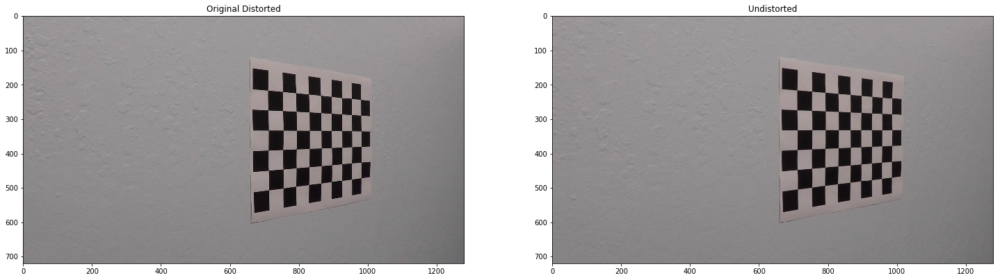

In [3]:
figure = plt.figure(figsize=[25, 25])

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, img_points, (1280, 720), None, None)
dst = cv2.undistort(img, mtx, dist, None, mtx)

figure.add_subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Distorted')
figure.add_subplot(1, 2, 2)
plt.imshow(dst)
plt.title('Undistorted')

# Pipeline

In [213]:
class Calibration:
    def __init__(self, mtx, dist):
        self.__mtx  = mtx
        self.__dist = dist

    @property
    def mtx(self):
        return self.__mtx

    @property
    def dist(self):
        return self.__dist


class Pipeline:
    def __init__(self, calibration):
        self.calibration = calibration

    # Helper Utilities
    def hls(self, image, threshold=[170, 255]):
        """Extract S channel from image"""
        hls_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        s_channel = hls_image[:,:, 2]

        binary = np.zeros_like(s_channel)
        binary[(s_channel >= threshold[0]) & (s_channel <= threshold[1])] = 1

        return binary

    def undistort(self, image):
        """Undistort the image given the distortion matrix and destination points"""
        return cv2.undistort(image,
            self.calibration.mtx,
            self.calibration.dist, None,
            self.calibration.mtx)

    def lab(self, image, threshold=[150,255]):
        lab_color_space = cv2.cvtColor(image, cv2.COLOR_RGB2Lab)
        b_channel = lab_color_space[:, :, 2]

        binary = np.zeros_like(b_channel)
        binary[((b_channel >= threshold[0]) & (b_channel <= threshold[1]))] = 1

        return binary

    def color_threshold(self, image):
        """Extract R and S channels from `image`."""
        b_channel_threshold = self.lab(image)
        s_channel_threshold = self.hls(image)

        color_composite = np.zeros_like(s_channel_threshold)
        color_composite[((s_channel_threshold == 1) | (b_channel_threshold == 1))] = 1

        return color_composite

    def sobelize(self, image, kernel_size=9):
        """Helper function to calculate the Sobel in the X and Y directions"""
        sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = kernel_size)
        sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize = kernel_size)

        return sobel_x, sobel_y

    def sobel_threshold(self, image, orientation='x', min_threshold=30, max_threshold=255):
        """Absolute Sobel threshold. Adapted from the lectures."""
        if orientation == 'x':
            sobel, _ = self.sobelize(image)
        else:
            _, sobel = self.sobelize(image)

        absolute_sobel = np.absolute(sobel)
        scaled_sobel = np.uint8(np.multiply(255, absolute_sobel) / np.max(absolute_sobel))

        binary = np.zeros_like(scaled_sobel)
        binary[(scaled_sobel >= min_threshold) & (scaled_sobel <= max_threshold)] = 1

        return binary

    def magnitude_threshold(self, image, sobel_kernel_size=9, threshold=[40, 200]):
        """Adapted from the lectures"""

        sobel_x, sobel_y = self.sobelize(image, kernel_size=sobel_kernel_size)

        gradient_magnitude = np.sqrt(np.square(sobel_x) + np.square(sobel_y))
        scaling_factor = np.divide(np.max(gradient_magnitude), 255)
        scaled_gradient = np.divide(gradient_magnitude, scaling_factor).astype(np.uint8)

        binary = np.zeros_like(scaled_gradient)
        binary[(scaled_gradient >= threshold[0]) & (scaled_gradient <= threshold[1])] = 1

        return binary

    def directional_threshold(self, image, sobel_kernel_size=9, threshold=[0.6, 1.1]):
        """Adapted from the lectures"""

        sobel_x, sobel_y = self.sobelize(image, kernel_size = sobel_kernel_size)

        directional_gradient = np.arctan2(np.absolute(sobel_y), np.absolute(sobel_x))

        binary =  np.zeros_like(directional_gradient)
        binary[(directional_gradient >= threshold[0]) & (directional_gradient <= threshold[1])] = 1

        return binary

    def gradient_thresholds(self, image):
        # Sobel Gradients
        x_gradient = self.sobel_threshold(image, orientation='x', min_threshold=30, max_threshold=200)
        y_gradient = self.sobel_threshold(image, orientation='y', min_threshold=30, max_threshold=200)

        # Mag Gradient
        magnitude_threshold = self.magnitude_threshold(image, threshold=[50, 255])
        # Directional Gradient
        directional_gradient = self.directional_threshold(image, threshold=[0.7, 1.3])

        gradient_composite = np.zeros_like(directional_gradient)
        gradient_composite[((x_gradient == 1 | (magnitude_threshold == 1)) & ((directional_gradient == 1) | (y_gradient == 1)))] = 1

        return gradient_composite

    def composite_threshold(self, gradient_threshold, color_threshold):
        """Combine Gradient and Color threholds"""
        binary = np.zeros_like(gradient_threshold)
        binary[(gradient_threshold == 1) | (color_threshold == 1)] = 1

        return binary

    def warp(self, image):
        image_size = (image.shape[1], image.shape[0])
        
#         bottom_left = [220,720]
#         bottom_right = [1110, 720]
#         top_left = [570, 470]
#         top_right = [722, 470]

#         source = np.float32([bottom_left,bottom_right,top_right,top_left])

#         bottom_left = [320,720]
#         bottom_right = [920, 720]
#         top_left = [320, 1]
#         top_right = [920, 1]

#         destination = np.float32([bottom_left,bottom_right,top_right,top_left])

        source = np.float32(
            [[500, 480],
             [810, 482],
             [1250, 720],
             [40, 720]])

        destination = np.float32(
            [[0, 0],
             [1200, 0],
             [1200, 720],
             [0, 720]])

        matrix = cv2.getPerspectiveTransform(source, destination)
        inverse_matrix = cv2.getPerspectiveTransform(destination, source)
        warped_image = cv2.warpPerspective(image, matrix, image_size, flags=cv2.INTER_LINEAR)

        return warped_image, matrix, inverse_matrix

    def find_lane(self, binary_warped, **kwargs):
        """Adapted from Udacity's lectures"""
        histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:,:], axis=0)
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        midpoint = np.int(histogram.shape[0] / 2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint
        nwindows = 9
        window_height = np.int(binary_warped.shape[0]/nwindows)
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        leftx_current = leftx_base
        rightx_current = rightx_base
        margin = 100
        minpix = 50
        left_lane_inds = []
        right_lane_inds = []
        for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin

            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)

            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # Fit a second order polynomial to each
#         print(lefty.shape, leftx.shape)
#         print(righty.shape, rightx.shape)
        left_fit = np.polyfit(lefty, leftx, 2)
        if righty.shape == 0 or rightx.shape == 0:
            return 

        right_fit = np.polyfit(righty, rightx, 2)


        # Generate x and y values for plotting
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        return ploty, lefty, righty, leftx, rightx, left_fitx, right_fitx

    def curvature_offset(self, ploty, lefty, righty, leftx, rightx, leftfitx, rightfitx):
        image_width, image_height = 1280, 720
        y_eval = np.max(ploty)

        lane_pixel_width = np.multiply(image_width, 0.57)
        meters_per_pixel_y = np.divide(23, image_height)
        meters_per_pixel_x = np.divide(3.7, lane_pixel_width)

        left_fit_cr = np.polyfit(lefty * meters_per_pixel_y, leftx * meters_per_pixel_x, deg=2)
        right_fit_cr = np.polyfit(righty * meters_per_pixel_y, rightx * meters_per_pixel_x, deg=2)

        # Adapted from Udacity lectures
        radius_curvature_left = ((1 + (2 * left_fit_cr[0] * y_eval * meters_per_pixel_y + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(2 * left_fit_cr[0])
        right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval*meters_per_pixel_y + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(2 * right_fit_cr[0])
        curvature_radius = np.mean([radius_curvature_left, right_curverad])
        
        lane_center = (rightfitx[719] + leftfitx[719])/2
        xm_per_pix = 3.7 / 700 
        center_offset_pixels = abs(image_width / 2 - lane_center)
        center_offset_mtrs = xm_per_pix * center_offset_pixels

#         car_center = (left_fitx[-1] + right_fitx[-1]) / 2
#         image_center = image_width / 2
#         vehicle_offset = (image_center - car_center) * (3.7/700)

        return curvature_radius, center_offset_mtrs

    def draw_lane(self, warped_image, undistorted_image, inverse_matrix, ploty,
            left_fitx, right_fitx, curvature_radius, vehicle_offset):
        """Draw the lane onto the image and apply the text."""
        warp_zero = np.zeros_like(warped_image).astype(np.uint8)

        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
        image_size = (color_warp.shape[1], color_warp.shape[0])

        left_points = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        right_points = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        left_and_right_points = np.hstack((left_points, right_points))

        cv2.fillPoly(color_warp, np.int_([left_and_right_points]), (0,255, 0))
        newwarp = cv2.warpPerspective(color_warp, inverse_matrix, image_size)
        result = cv2.addWeighted(undistorted_image, 1, newwarp, 0.3, 0)

        cv2.putText(result, 'Distance from center: {:.2f} m'.format(vehicle_offset), (100,80), fontFace = 16,\
                        fontScale = 2, color=(255,255,255), thickness = 4)

        cv2.putText(result, 'Radius of Curvature {} m'.format(int(curvature_radius)), (120,140),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 4)

        return result

    def run(self, image):
        # Undisort the image
        undistorted_image = self.undistort(image)
        
        gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
        # Color thresholds
        color_threshold = self.color_threshold(undistorted_image)

        # Gradient threshold
        gradient_threshold = self.gradient_thresholds(gray)

        # Combine Gradient and Color thresholding
        combined_thresholds = self.composite_threshold(gradient_threshold, color)

        # Warp the image
        warped_image, _, inverse_matrix = self.warp(combined_thresholds)
        
        # Draw the lane and derive the curvature offeset
        ploty, lefty, righty, leftx, rightx, left_fitx, right_fitx = self.find_lane(warped_image)

        curvature_radius, car_offset = self.curvature_offset(ploty, lefty, righty, leftx, rightx, left_fitx, right_fitx)

        output = self.draw_lane(warped_image, undistorted_image,
            inverse_matrix, ploty, left_fitx, right_fitx, curvature_radius, car_offset)

        return output


In [214]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, img_points, (1280, 720), None, None)

calibration = Calibration(mtx=mtx, dist=dist)
pipeline = Pipeline(calibration)

test_images = glob.glob('/Users/erik/Desktop/output_images/image-*.png')
imgs = []
for path in test_images:
    image = cv2.imread(path)
    imgs.append({ 'image': image, 'path': path })
    
test_images = imgs

# Undistortion

Text(0.5,1,'Undistorted')

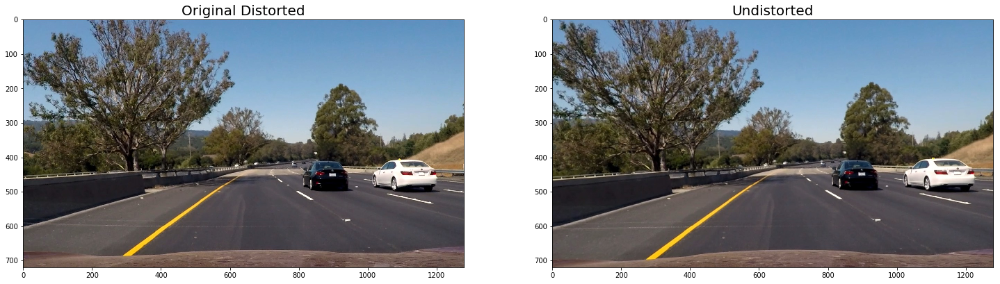

In [43]:
figure = plt.figure(figsize=[25, 25])

image = cv2.imread('test_images/test6.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Use distortion matrix to undistort image
dst = pipeline.undistort(image)
    
figure.add_subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Distorted', fontsize=20)
figure.add_subplot(1, 2, 2)
plt.imshow(dst)
plt.title('Undistorted', fontsize=20)

# Color Threshold

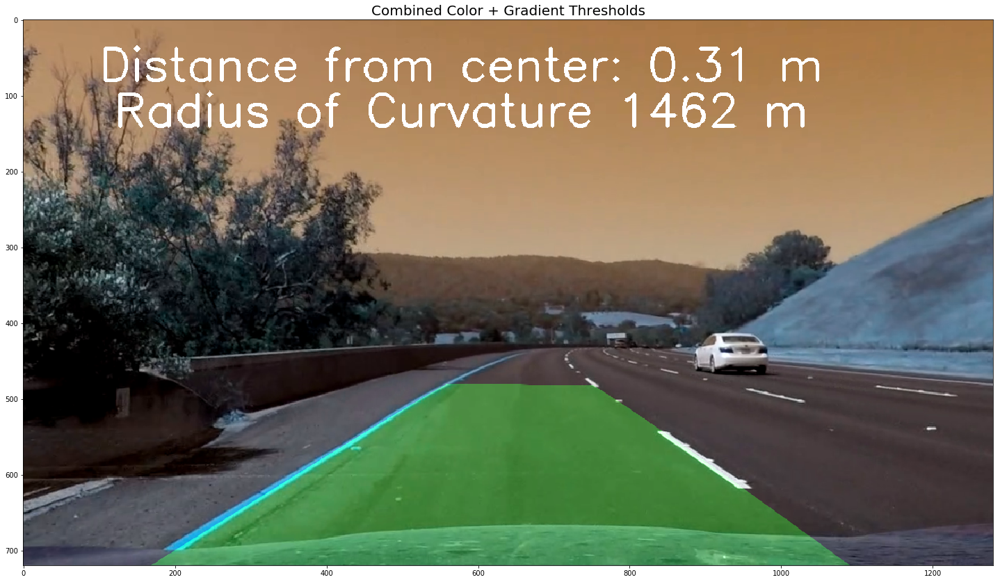

In [215]:
figure = plt.figure(figsize=[25, 25])

image = cv2.imread('/Users/erik/Desktop/output_images/image-19-47-32-816377.png')
color = image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

color = pipeline.color_threshold(image)
gradient = pipeline.gradient_thresholds(gray)

out = pipeline.composite_threshold(gradient, color)
yo  = pipeline.run(image)
plt.title('Combined Color + Gradient Thresholds', fontsize=20)
plt.imshow(yo, cmap='gray')

# Perspective Transform

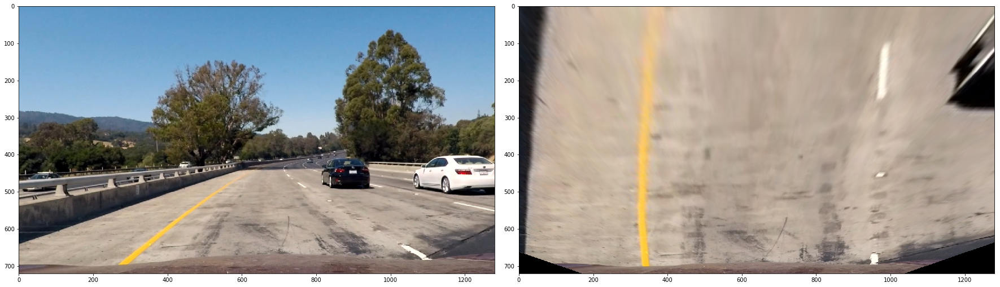

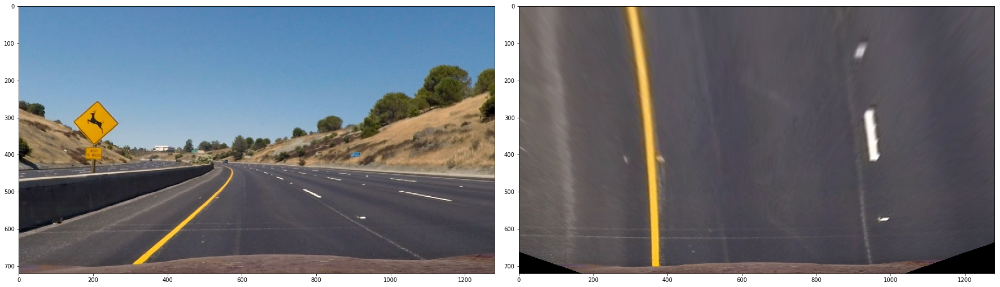

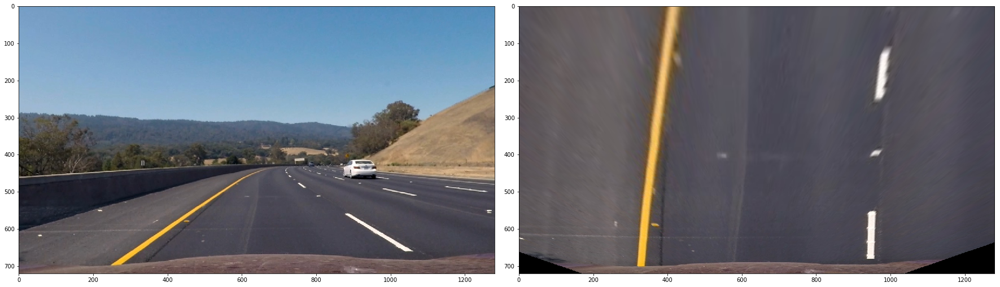

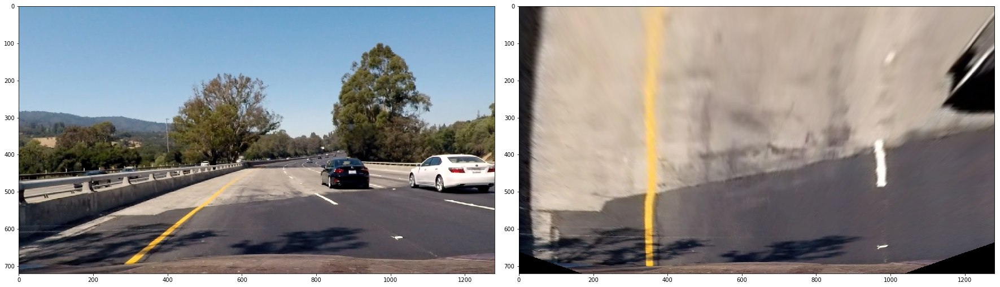

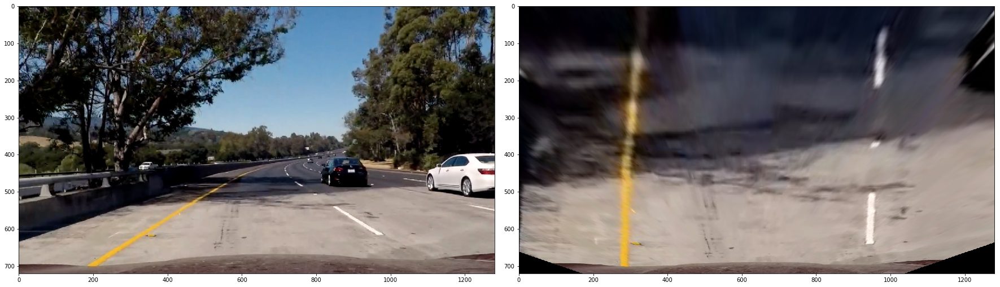

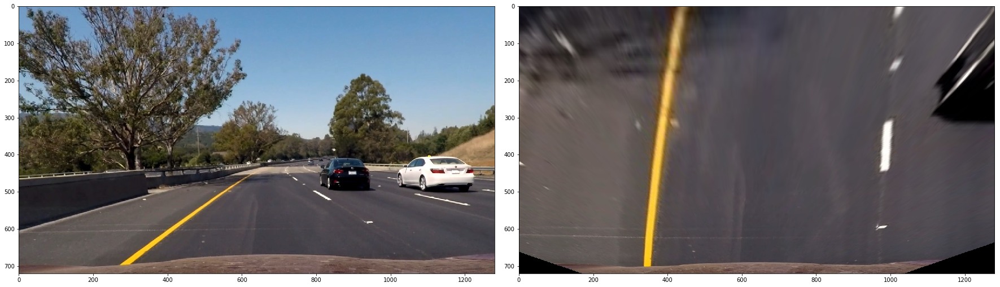

In [205]:
figure = plt.figure(figsize=[20, 20])

images, warped_images = [], []

# Read in some images
for index in range(6):
    image = cv2.imread(f"test_images/test{index + 1}.jpg")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    images.append(pipeline.undistort(image))
    
    # Transform perspective 
    warped_image, _, _ = pipeline.warp(image)
    warped_images.append(warped_image)

# Plot the images
for index, _ in enumerate(images):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(images[index])
    ax2.imshow(warped_images[index], cmap='gray')
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Detect and Fit Lane Lines

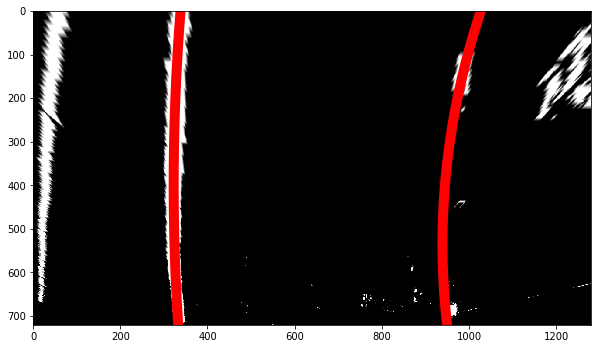

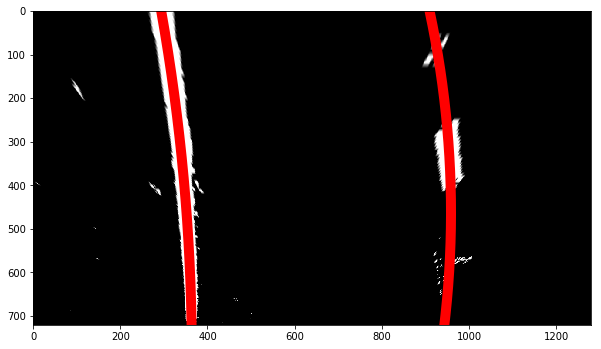

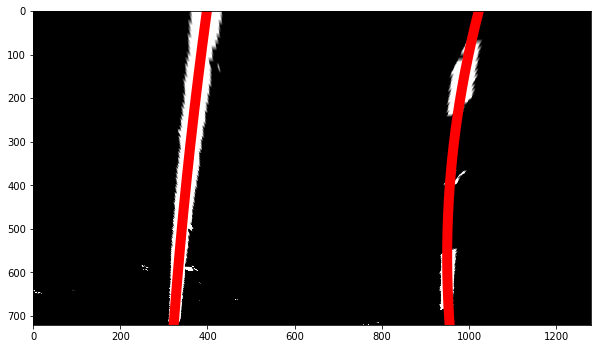

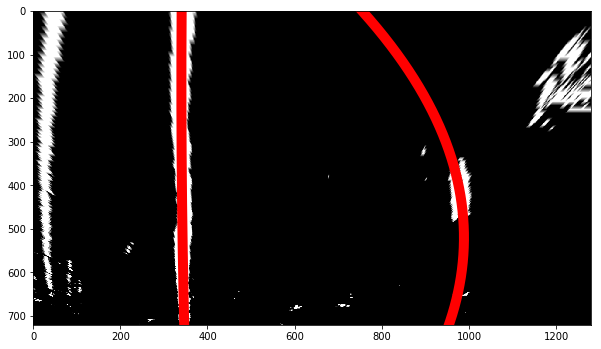

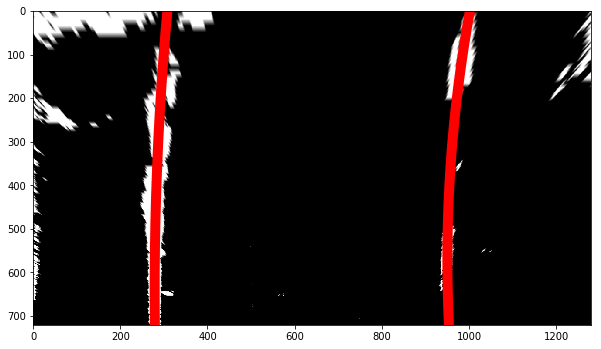

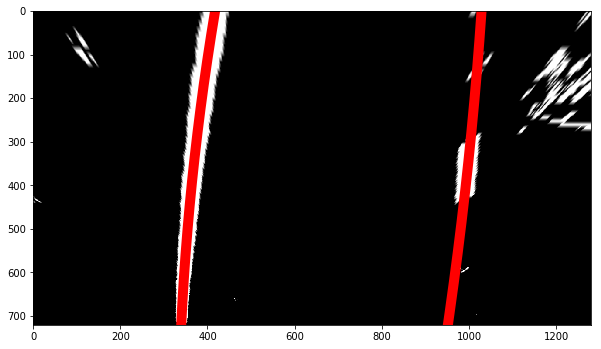

In [206]:
figure = plt.figure(figsize=[10, 10])

# Apply transformations 
for index, image in enumerate(images):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    original = image = pipeline.undistort(image)
    color_threshold    = image = pipeline.color_threshold(image)
    gradient_threshold = image = pipeline.gradient_thresholds(gray)
    image = pipeline.composite_threshold(gradient_threshold, color_threshold)
    image, _, _ = pipeline.warp(image)
    ploty, lefty, righty, leftx, rightx, left_fitx, right_fitx = pipeline.find_lane(image)
    
    f, (ax1) = plt.subplots(1, 1, figsize=(10, 10))
    ax1.imshow(image, cmap='gray')

    ax1.plot(left_fitx, ploty, color='red', linewidth=10)
    ax1.plot(right_fitx, ploty, color='red', linewidth=10)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

/Users/erik/Desktop/output_images/image-19-47-50-433230.png
/Users/erik/Desktop/output_images/image-19-47-55-423387.png
/Users/erik/Desktop/output_images/image-19-47-38-885194.png
/Users/erik/Desktop/output_images/image-19-47-52-941107.png
/Users/erik/Desktop/output_images/image-19-47-24-039766.png
/Users/erik/Desktop/output_images/image-19-47-39-389272.png
/Users/erik/Desktop/output_images/image-19-47-34-488532.png
/Users/erik/Desktop/output_images/image-19-47-44-402808.png
/Users/erik/Desktop/output_images/image-19-47-55-928471.png
/Users/erik/Desktop/output_images/image-19-47-32-816377.png
/Users/erik/Desktop/output_images/image-19-47-15-565434.png
/Users/erik/Desktop/output_images/image-19-47-14-855516.png
/Users/erik/Desktop/output_images/image-19-47-42-158865.png
/Users/erik/Desktop/output_images/image-19-47-55-023402.png
/Users/erik/Desktop/output_images/image-19-47-22-129385.png
/Users/erik/Desktop/output_images/image-19-47-55-997929.png
/Users/erik/Desktop/output_images/image-

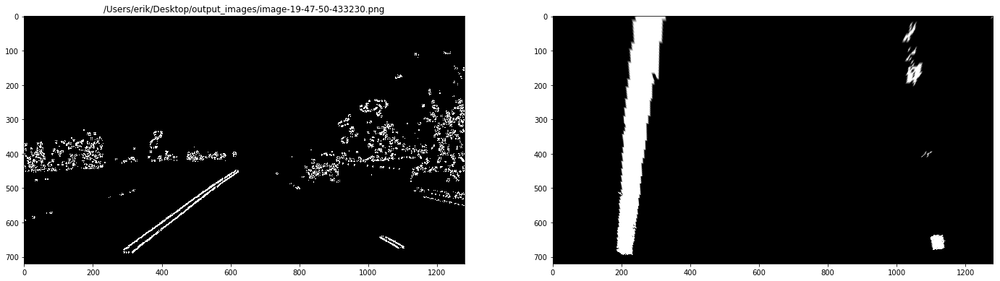

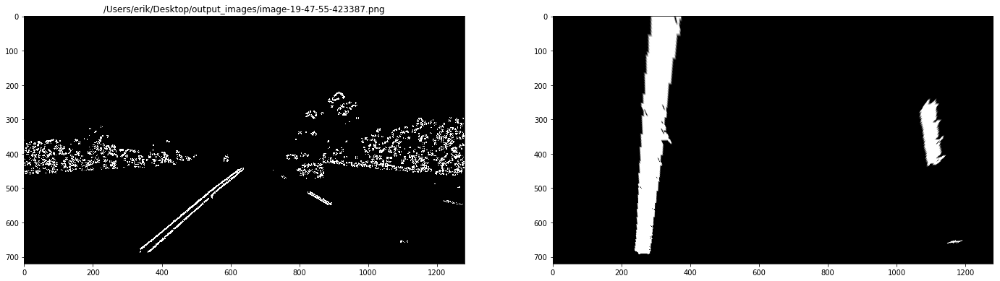

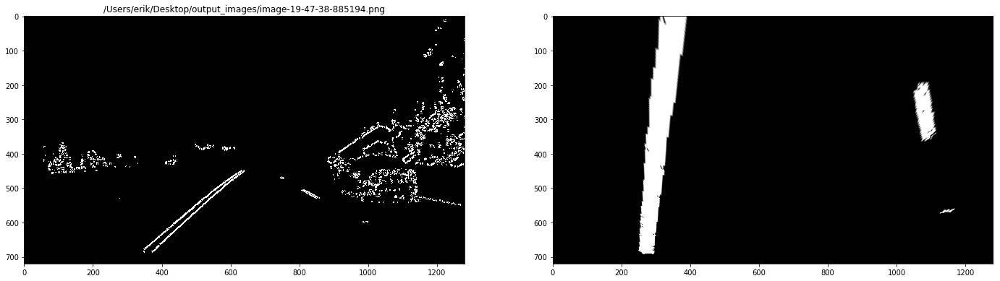

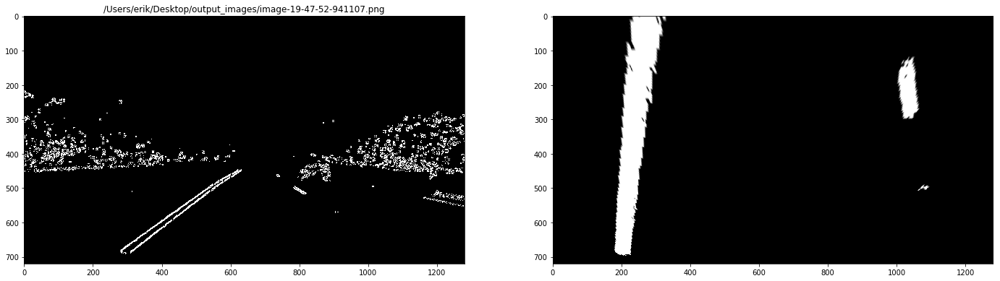

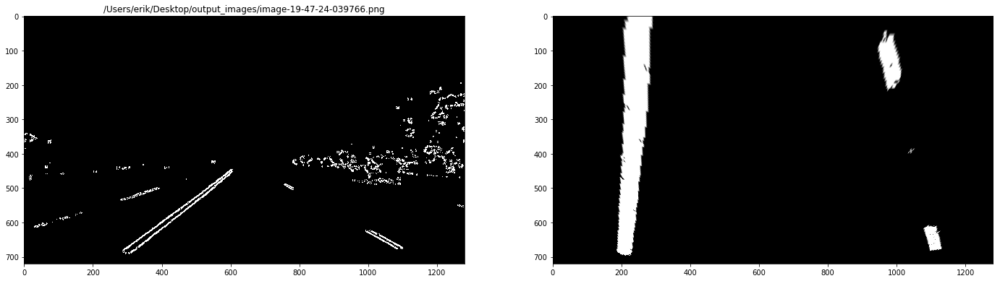

...

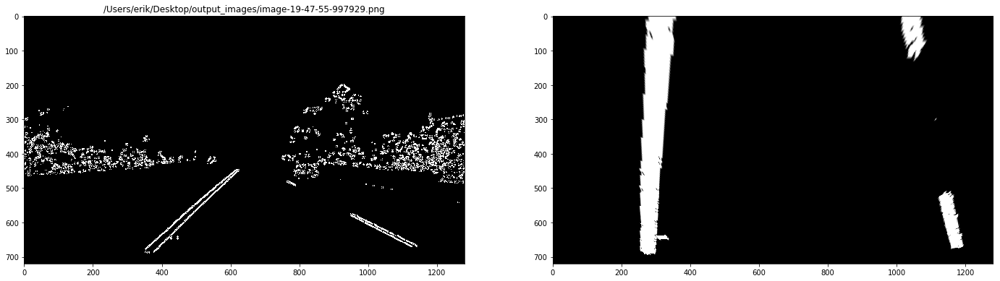

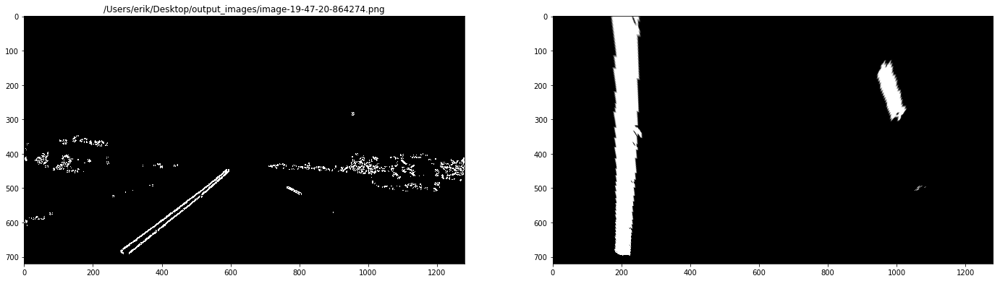

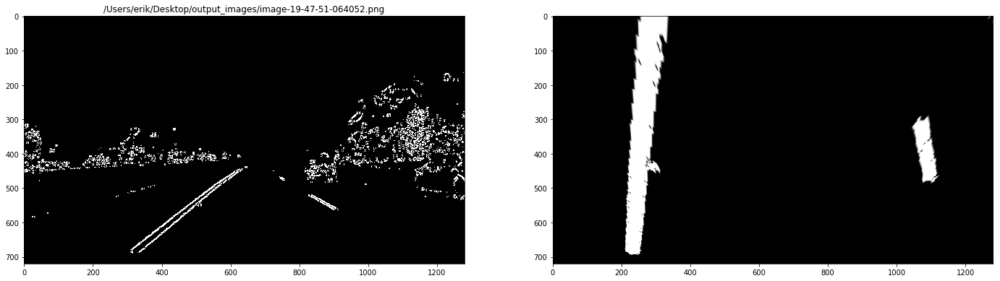

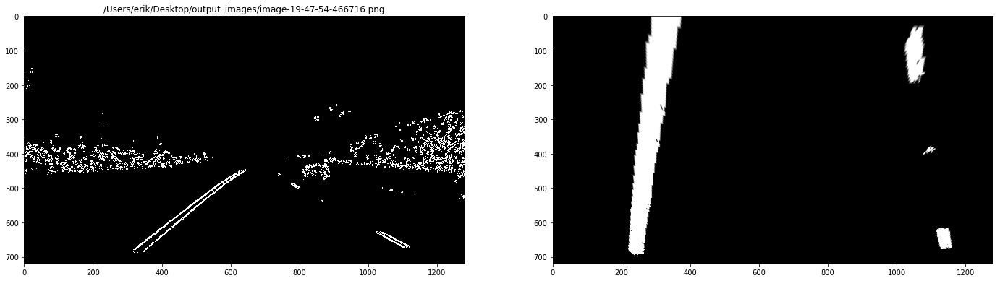

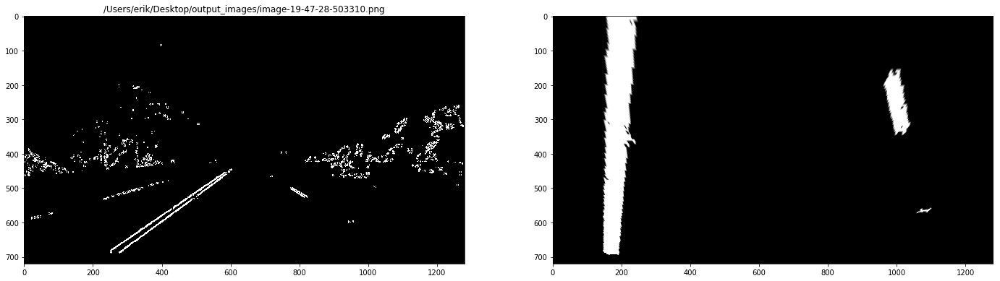

In [181]:
figure = plt.figure(figsize=[25, 25])

for index, lists in enumerate(test_images[80:100]):
    color = pipeline.color_threshold(lists['image'])
    grad = pipeline.gradient_thresholds(color)
    output_image, _, _  = pipeline.warp(pipeline.composite_threshold(grad, color))
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 25))
#     figure.add_subplot(100, 2, index + 1)
    ax1.imshow(grad, cmap='gray')
    print(lists['path'])
    ax1.set_title(lists['path'])
    ax2.imshow(output_image, cmap='gray') 

# Video Pipeline

In [216]:
project_video_processed = 'processed_video.mp4'
video = VideoFileClip("project_video.mp4")
processed_clip = video.fl_image(pipeline.run) # NOTE: this function expects color images!!
%time processed_clip.write_videofile(project_video_processed, audio=False)

[MoviePy] >>>> Building video processed_video.mp4
[MoviePy] Writing video processed_video.mp4


100%|█████████▉| 1260/1261 [05:56<00:00,  3.72it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: processed_video.mp4 

CPU times: user 5min 49s, sys: 1min 11s, total: 7min
Wall time: 5min 57s


In [217]:
project_video_processed = 'processed_video.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_processed))